# Modelling the behavior of a damped single pendulum

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

import keras
from keras.models import Sequential
from keras.layers import Dense, Activation, Dropout, LSTM, CuDNNLSTM, Bidirectional

import random
from random import seed, random
from sklearn.utils import shuffle
from sklearn import preprocessing

%matplotlib inline

/home/bipe26194/miniconda3/envs/tensorflow/lib/python3.6/site-packages/h5py/__init__.py:36: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
  from ._conv import register_converters as _register_converters
Using TensorFlow backend.
/home/bipe26194/miniconda3/envs/tensorflow/lib/python3.6/importlib/_bootstrap.py:219: RuntimeWarning: compiletime version 3.5 of module 'tensorflow.python.framework.fast_tensor_util' does not match runtime version 3.6
  return f(*args, **kwds)


In [2]:
np.random.seed(1337)  # for reproducibility

raw_data = pd.read_csv("data/MAP_WhitePen1.csv", na_filter=False)

# The first 5 rows of the csv
print(raw_data.head(5))

   VideoAnalysis: Time (s)  VideoAnalysis: X  VideoAnalysis: Y  \
0                 0.000000          5.816870          2.713342   
1                17.984633          0.259602        536.029317   
2                27.827800        409.940908        156.002507   
3                27.861167        408.413849        152.111882   
4                27.894533        395.640027        142.170234   

   VideoAnalysis: X Velocity  VideoAnalysis: Y Velocity  
0                   7.094623                  17.556862  
1                  14.407010                   5.374901  
2                  27.572473                 -17.006521  
3                 -92.153838                -116.531409  
4                -287.258757                -258.118791  


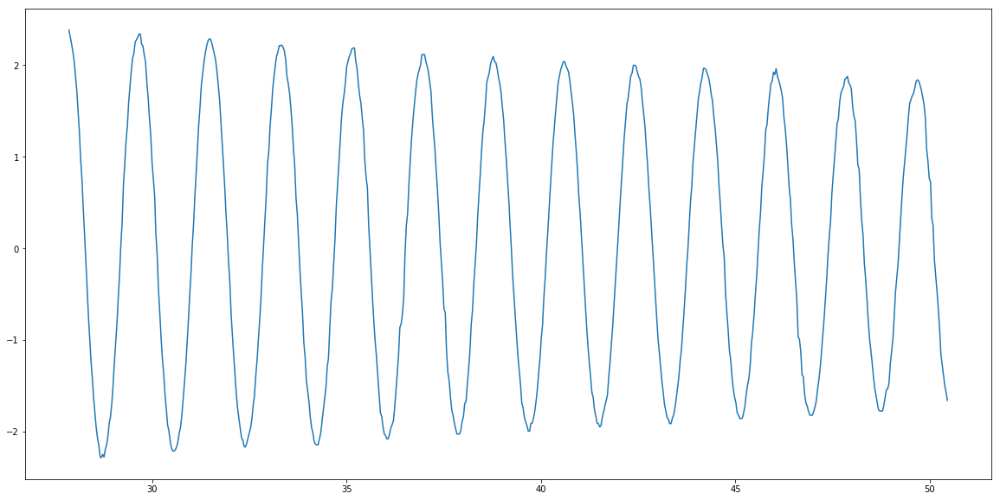

In [3]:
window = 1
edge = int(np.ceil(window/2))

def preprocess(data):
    # Calculate the moving average
    data = data.rolling(window=window,center=True).mean()
    # Trim the data that wasn't part of the moving average
    data = data[edge:-edge]
    # Standardize the data
    return preprocessing.scale(data) 

time_data = raw_data["VideoAnalysis: Time (s)"][edge:-edge].values
X_data = preprocess(raw_data["VideoAnalysis: X"])
Y_data = preprocess(raw_data["VideoAnalysis: Y"])

a = 2
b = 680
data = np.array(X_data[a:b])
time = time_data[a:b]
plt.figure(figsize=(20,10))
# plt.plot(x)
plt.plot(time, data)

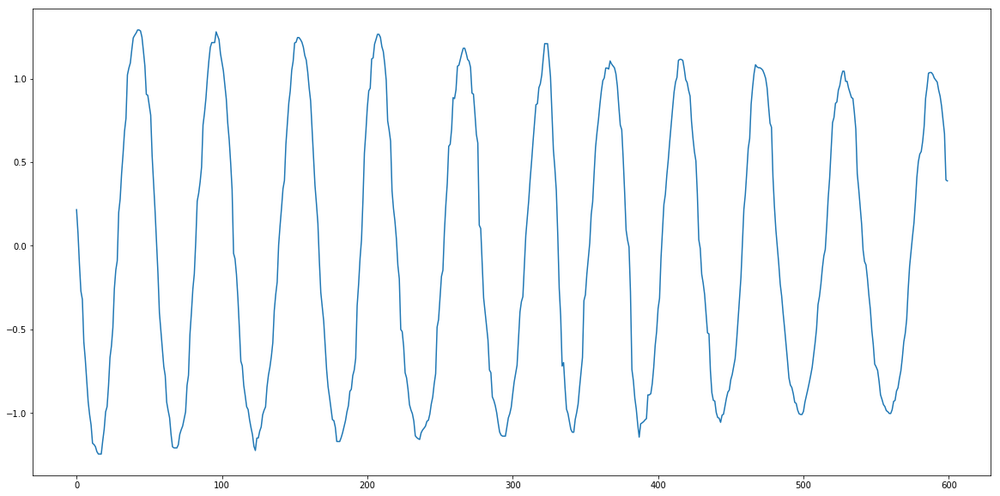

In [4]:
c = 700
d = 1300
data1 = X_data[c:d]
time1 = time_data[c:d]
plt.figure(figsize=(20,10))
# plt.plot(x)
plt.plot(data1)

In [5]:
# hyperparameters
DATA_DIM = 1
N_PREV = 55 # number of previous steps used to predict the next step

In [6]:
def _load_data(data, n_prev=N_PREV, is_shuffled=False):
    docX, docY = [], []
    for j in range(len(data)-n_prev):
        docX.append(data[j:j+n_prev])
        docY.append(data[j+n_prev])   
    alsX = np.array(docX)
    alsY = np.array(docY)
    if is_shuffled: 
        alsX, alsY = shuffle(alsX, alsY)

    return alsX.reshape(alsX.shape[0], alsX.shape[1], DATA_DIM), alsY.reshape(alsY.shape[0], DATA_DIM)

def train_test_split(data, test_size=0.6):  
    """
    This just splits data to training and testing parts
    """
    ntrn = int(round(len(data) * (1 - test_size)))

    X_train, y_train = _load_data(data[0:ntrn], is_shuffled=True)
    X_test, y_test = _load_data(data[ntrn:])

    return (X_train, y_train), (X_test, y_test)


# retrieve data
(X_train, y_train), (X_test, y_test) = train_test_split(data, 0.1)

# extra data
# (X_train1, y_train1), (X_test1, y_test1) = train_test_split(data1, 0.1)
# X_train = np.append(X_train, X_train1, axis=0)
# y_train = np.append(y_train, y_train1, axis=0)
# X_train, y_train = shuffle(X_train, y_train)

In [7]:
# generate the time axis for visualization
t_step = np.mean(time[1:]-time[:-1])
t_start = time[-len(y_test)]

def gen_time(data):
    t = np.arange(t_start, t_start+len(data)*t_step, t_step)
    return t

Train on 527 samples, validate on 28 samples
Epoch 1/10
527/527 [==============================] - 1s 1ms/step - loss: 2.5998 - val_loss: 2.8071
Epoch 2/10
527/527 [==============================] - 0s 340us/step - loss: 2.1825 - val_loss: 2.3349
Epoch 3/10
527/527 [==============================] - 0s 336us/step - loss: 1.8179 - val_loss: 1.9147
Epoch 4/10
527/527 [==============================] - 0s 335us/step - loss: 1.4975 - val_loss: 1.5497
Epoch 5/10
527/527 [==============================] - 0s 334us/step - loss: 1.2125 - val_loss: 1.2444
Epoch 6/10
527/527 [==============================] - 0s 335us/step - loss: 0.9664 - val_loss: 0.9606
Epoch 7/10
527/527 [==============================] - 0s 336us/step - loss: 0.7499 - val_loss: 0.7185
Epoch 8/10
527/527 [==============================] - 0s 335us/step - loss: 0.5669 - val_loss: 0.5286
Epoch 9/10
527/527 [==============================] - 0s 336us/step - loss: 0.4233 - val_loss: 0.3834
Epoch 10/10
527/527 [==================

527/527 [==============================] - 0s 345us/step - loss: 0.0084 - val_loss: 0.0085
Epoch 6/10
527/527 [==============================] - 0s 343us/step - loss: 0.0083 - val_loss: 0.0085
Epoch 7/10
527/527 [==============================] - 0s 342us/step - loss: 0.0082 - val_loss: 0.0085
Epoch 8/10
527/527 [==============================] - 0s 341us/step - loss: 0.0081 - val_loss: 0.0083
Epoch 9/10
527/527 [==============================] - 0s 346us/step - loss: 0.0079 - val_loss: 0.0082
Epoch 10/10
527/527 [==============================] - 0s 338us/step - loss: 0.0079 - val_loss: 0.0082
Prediction score: 0.021539604647543946
Train on 527 samples, validate on 28 samples
Epoch 1/10
527/527 [==============================] - 0s 339us/step - loss: 0.0078 - val_loss: 0.0079
Epoch 2/10
527/527 [==============================] - 0s 344us/step - loss: 0.0077 - val_loss: 0.0080
Epoch 3/10
527/527 [==============================] - 0s 341us/step - loss: 0.0075 - val_loss: 0.0077
Epoch 4/

527/527 [==============================] - 0s 347us/step - loss: 0.0033 - val_loss: 0.0043
Epoch 10/10
527/527 [==============================] - 0s 339us/step - loss: 0.0033 - val_loss: 0.0040
Prediction score: 0.00875293173079297
Train on 527 samples, validate on 28 samples
Epoch 1/10
527/527 [==============================] - 0s 347us/step - loss: 0.0033 - val_loss: 0.0041
Epoch 2/10
527/527 [==============================] - 0s 336us/step - loss: 0.0032 - val_loss: 0.0042
Epoch 3/10
527/527 [==============================] - 0s 345us/step - loss: 0.0031 - val_loss: 0.0039
Epoch 4/10
527/527 [==============================] - 0s 345us/step - loss: 0.0030 - val_loss: 0.0041
Epoch 5/10
527/527 [==============================] - 0s 348us/step - loss: 0.0031 - val_loss: 0.0038
Epoch 6/10
527/527 [==============================] - 0s 341us/step - loss: 0.0030 - val_loss: 0.0040
Epoch 7/10
527/527 [==============================] - 0s 343us/step - loss: 0.0031 - val_loss: 0.0041
Epoch 8/1

/home/bipe26194/miniconda3/envs/tensorflow/lib/python3.6/site-packages/matplotlib/pyplot.py:528: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


527/527 [==============================] - 0s 350us/step - loss: 0.0019 - val_loss: 0.0033
Epoch 2/10
527/527 [==============================] - 0s 344us/step - loss: 0.0019 - val_loss: 0.0032
Epoch 3/10
527/527 [==============================] - 0s 349us/step - loss: 0.0019 - val_loss: 0.0030
Epoch 4/10
527/527 [==============================] - 0s 341us/step - loss: 0.0019 - val_loss: 0.0032
Epoch 5/10
527/527 [==============================] - 0s 347us/step - loss: 0.0018 - val_loss: 0.0030
Epoch 6/10
527/527 [==============================] - 0s 340us/step - loss: 0.0019 - val_loss: 0.0031
Epoch 7/10
527/527 [==============================] - 0s 340us/step - loss: 0.0019 - val_loss: 0.0032
Epoch 8/10
527/527 [==============================] - 0s 337us/step - loss: 0.0018 - val_loss: 0.0035
Epoch 9/10
527/527 [==============================] - 0s 340us/step - loss: 0.0019 - val_loss: 0.0030
Epoch 10/10
527/527 [==============================] - 0s 344us/step - loss: 0.0018 - val_los

527/527 [==============================] - 0s 348us/step - loss: 0.0016 - val_loss: 0.0029
Epoch 6/10
527/527 [==============================] - 0s 346us/step - loss: 0.0016 - val_loss: 0.0029
Epoch 7/10
527/527 [==============================] - 0s 350us/step - loss: 0.0016 - val_loss: 0.0027
Epoch 8/10
527/527 [==============================] - 0s 345us/step - loss: 0.0016 - val_loss: 0.0029
Epoch 9/10
527/527 [==============================] - 0s 353us/step - loss: 0.0016 - val_loss: 0.0029
Epoch 10/10
527/527 [==============================] - 0s 347us/step - loss: 0.0016 - val_loss: 0.0027
Prediction score: 0.021560749067706837
Train on 527 samples, validate on 28 samples
Epoch 1/10
527/527 [==============================] - 0s 352us/step - loss: 0.0016 - val_loss: 0.0030
Epoch 2/10
527/527 [==============================] - 0s 343us/step - loss: 0.0016 - val_loss: 0.0029
Epoch 3/10
527/527 [==============================] - 0s 346us/step - loss: 0.0016 - val_loss: 0.0030
Epoch 4/

527/527 [==============================] - 0s 350us/step - loss: 0.0015 - val_loss: 0.0025
Epoch 10/10
527/527 [==============================] - 0s 350us/step - loss: 0.0015 - val_loss: 0.0026
Prediction score: 0.0038385286964686513
Train on 527 samples, validate on 28 samples
Epoch 1/10
527/527 [==============================] - 0s 344us/step - loss: 0.0016 - val_loss: 0.0027
Epoch 2/10
527/527 [==============================] - 0s 347us/step - loss: 0.0016 - val_loss: 0.0024
Epoch 3/10
527/527 [==============================] - 0s 353us/step - loss: 0.0016 - val_loss: 0.0026
Epoch 4/10
527/527 [==============================] - 0s 344us/step - loss: 0.0015 - val_loss: 0.0025
Epoch 5/10
527/527 [==============================] - 0s 346us/step - loss: 0.0016 - val_loss: 0.0023
Epoch 6/10
527/527 [==============================] - 0s 346us/step - loss: 0.0016 - val_loss: 0.0026
Epoch 7/10
527/527 [==============================] - 0s 349us/step - loss: 0.0015 - val_loss: 0.0028
Epoch 8

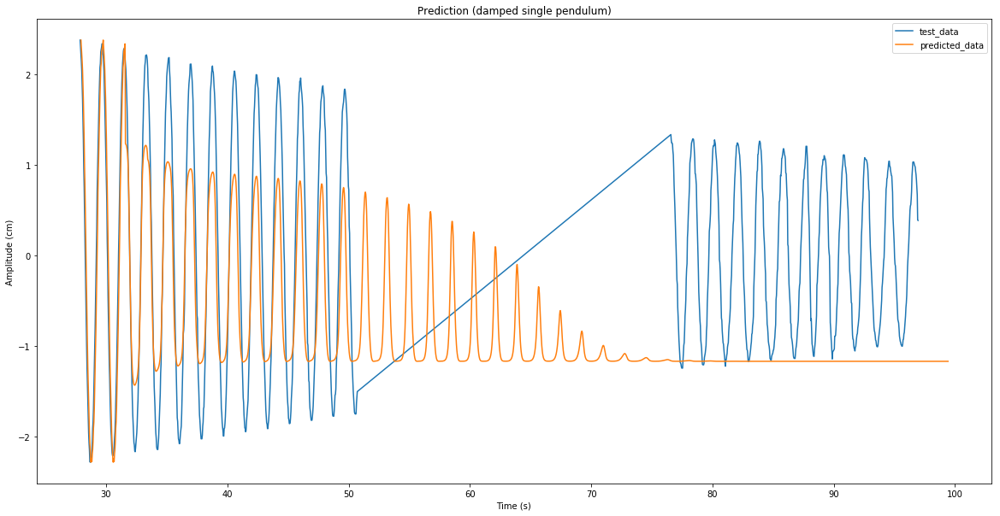

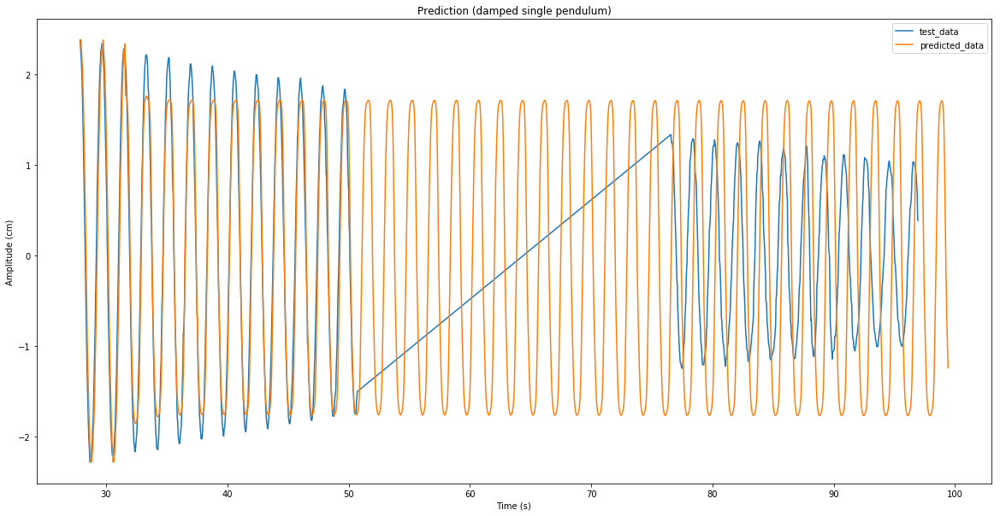

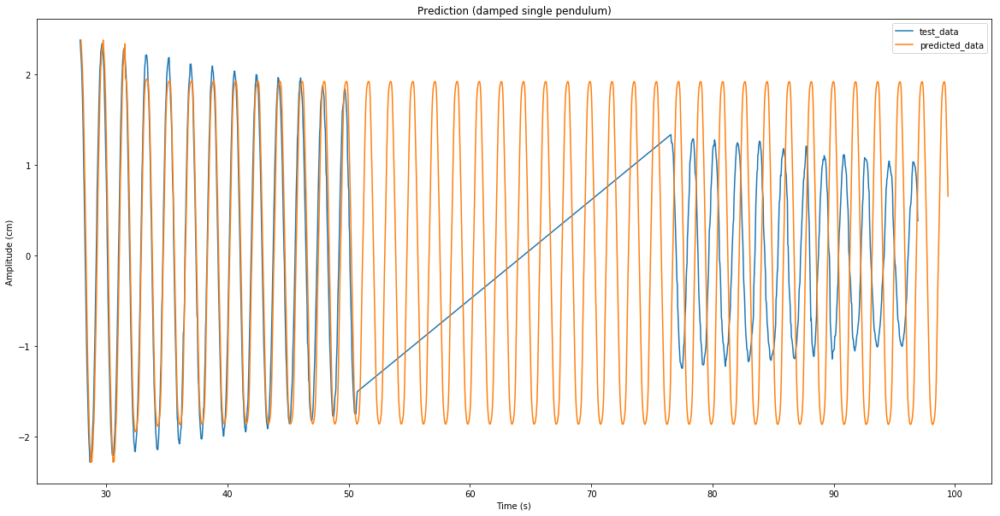

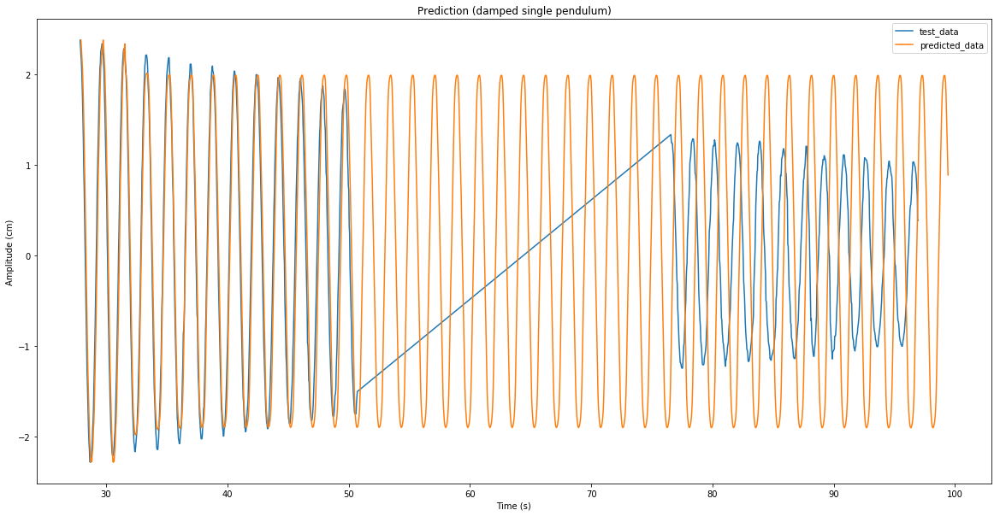

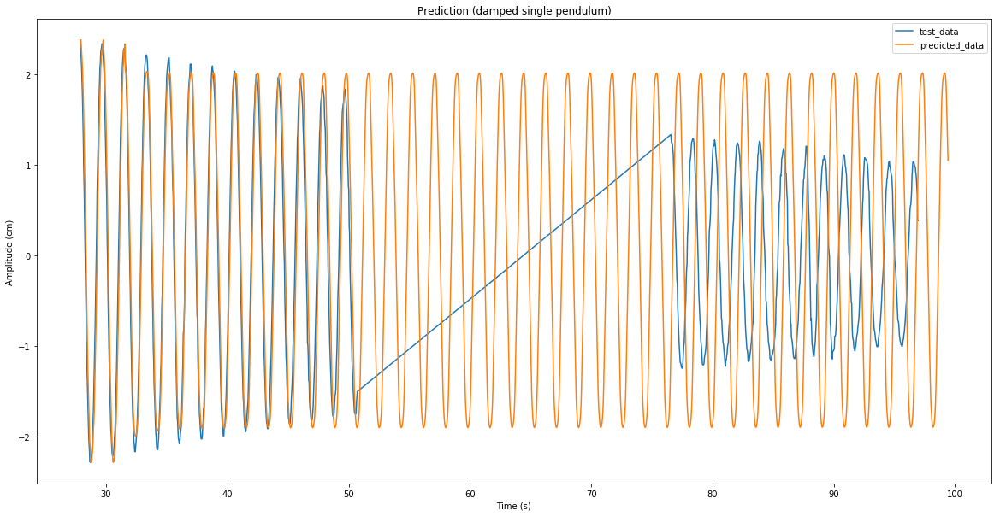

...

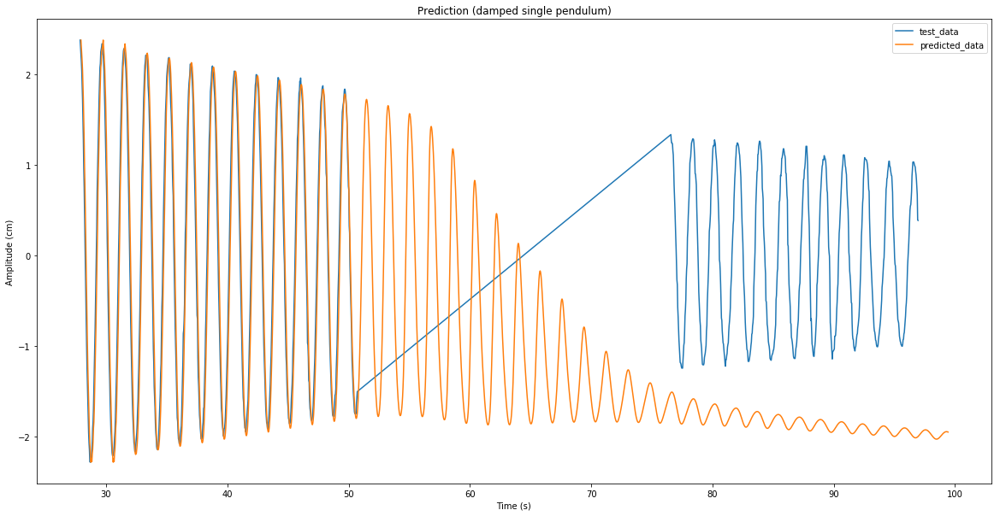

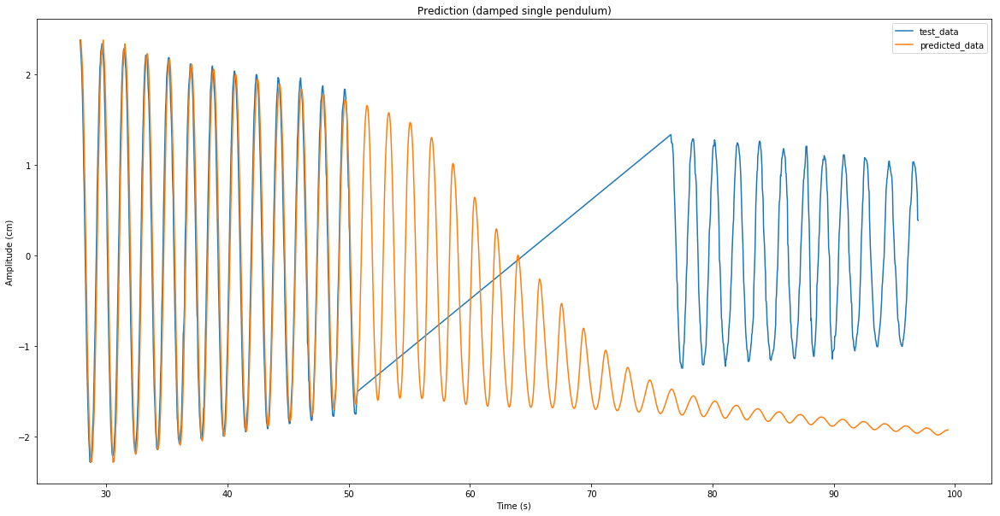

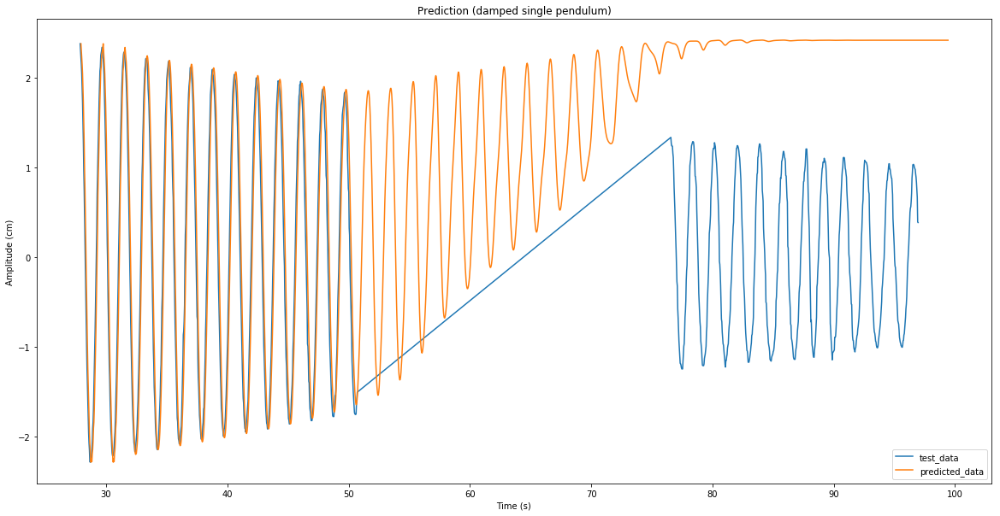

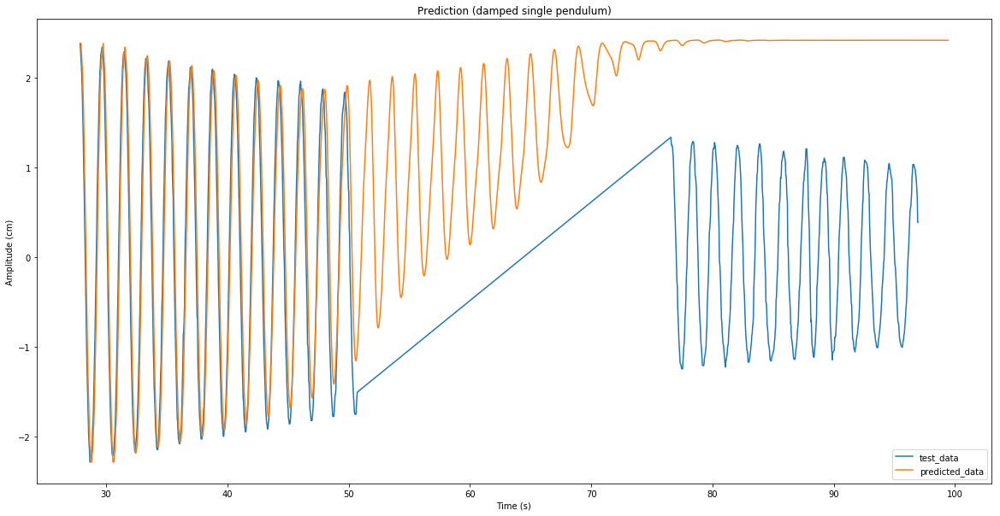

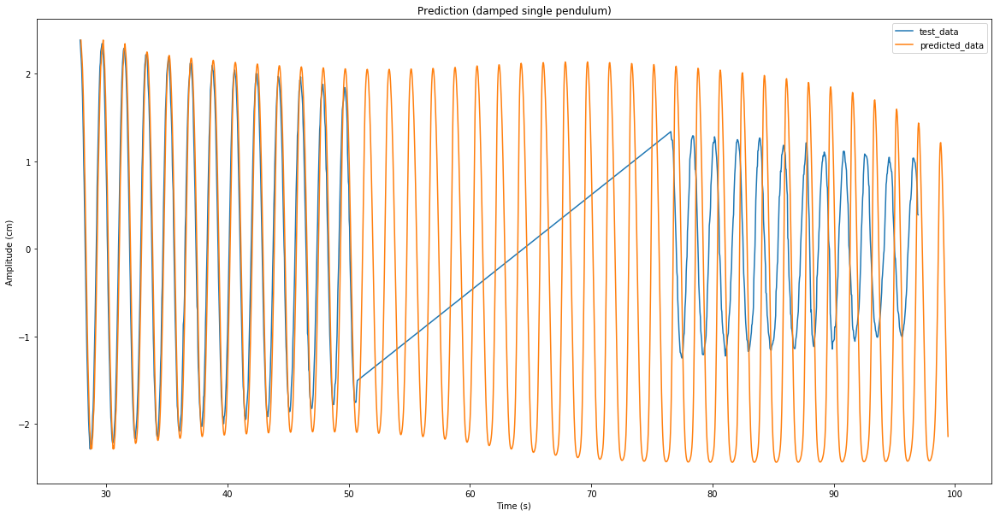

In [12]:
# define model structure
model = Sequential()
model.add(Bidirectional(CuDNNLSTM(units=5, return_sequences=False), input_shape=(None, DATA_DIM)))
# model.add(Bidirectional(CuDNNLSTM(units=5, return_sequences=False)))
# model.add(Bidirectional(CuDNNLSTM(units=50, return_sequences=False)))
# model.add(Bidirectional(CuDNNLSTM(units=10, return_sequences=False)))
model.add(Dense(units=1, activation="linear"))
model.compile(loss="mean_squared_error", optimizer="adam")

# and now train the model
# batch_size should be appropriate to your memory size
# number of epochs should be higher for real world problems
for i in range(40):
    history = model.fit(X_train, y_train, batch_size=32, epochs=10, validation_split=0.05)
    # perform modelling
    X_model = data[0:N_PREV]
    modelled_data = list(data[0:N_PREV])
    dims = 1, X_model.shape[0], DATA_DIM
    for i in range(len(data)*3):
        prev_steps = X_model.reshape(*dims)
        next_step = model.predict(prev_steps)
        modelled_data.append(next_step[0])
        X_model = np.append(X_model[1:], next_step)

    # evaluate
    modelled_data = np.append(data[0:N_PREV], np.array(modelled_data), axis=0)
    print('Prediction score:', np.mean((modelled_data[:len(data)]-data)**2))
    
    # visualize prediction performance
    t_start = time[a]
    t2 = np.arange(t_start, t_start+len(modelled_data)*t_step, t_step)

    plt.figure(figsize=(20,10))
    plt.plot(time_data[a:d], X_data[a:d], label='test_data')
    plt.plot(t2[:len(modelled_data)], modelled_data[:], label='predicted_data')
    plt.title('Prediction (damped single pendulum)')
    plt.xlabel('Time (s)')
    plt.ylabel('Amplitude (cm)')
    plt.legend()

Train on 527 samples, validate on 28 samples
Epoch 1/1
527/527 [==============================] - 1s 2ms/step - loss: 0.3725 - val_loss: 0.0736
Prediction score: 4.492230823277651
Train on 527 samples, validate on 28 samples
Epoch 1/1
527/527 [==============================] - 1s 1ms/step - loss: 0.0181 - val_loss: 0.0079
Prediction score: 0.05983895766280415
Train on 527 samples, validate on 28 samples
Epoch 1/1
527/527 [==============================] - 1s 1ms/step - loss: 0.0048 - val_loss: 0.0065
Prediction score: 0.05093456703366866
Train on 527 samples, validate on 28 samples
Epoch 1/1
527/527 [==============================] - 1s 1ms/step - loss: 0.0033 - val_loss: 0.0044
Prediction score: 0.017272454728032627
Train on 527 samples, validate on 28 samples
Epoch 1/1
527/527 [==============================] - 1s 1ms/step - loss: 0.0029 - val_loss: 0.0052
Prediction score: 0.03849302013139622
Train on 527 samples, validate on 28 samples
Epoch 1/1
527/527 [===========================

/home/bipe26194/miniconda3/envs/tensorflow/lib/python3.6/site-packages/matplotlib/pyplot.py:528: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


527/527 [==============================] - 1s 1ms/step - loss: 0.0018 - val_loss: 0.0030
Prediction score: 0.01538682994607156
Train on 527 samples, validate on 28 samples
Epoch 1/1
527/527 [==============================] - 1s 1ms/step - loss: 0.0020 - val_loss: 0.0033
Prediction score: 0.017578468140699254
Train on 527 samples, validate on 28 samples
Epoch 1/1
527/527 [==============================] - 1s 1ms/step - loss: 0.0022 - val_loss: 0.0039
Prediction score: 0.027663373447290033
Train on 527 samples, validate on 28 samples
Epoch 1/1
527/527 [==============================] - 1s 1ms/step - loss: 0.0024 - val_loss: 0.0049
Prediction score: 0.1726505173079574
Train on 527 samples, validate on 28 samples
Epoch 1/1
527/527 [==============================] - 1s 1ms/step - loss: 0.0020 - val_loss: 0.0029
Prediction score: 0.027783223573130535
Train on 527 samples, validate on 28 samples
Epoch 1/1
527/527 [==============================] - 1s 1ms/step - loss: 0.0018 - val_loss: 0.0028

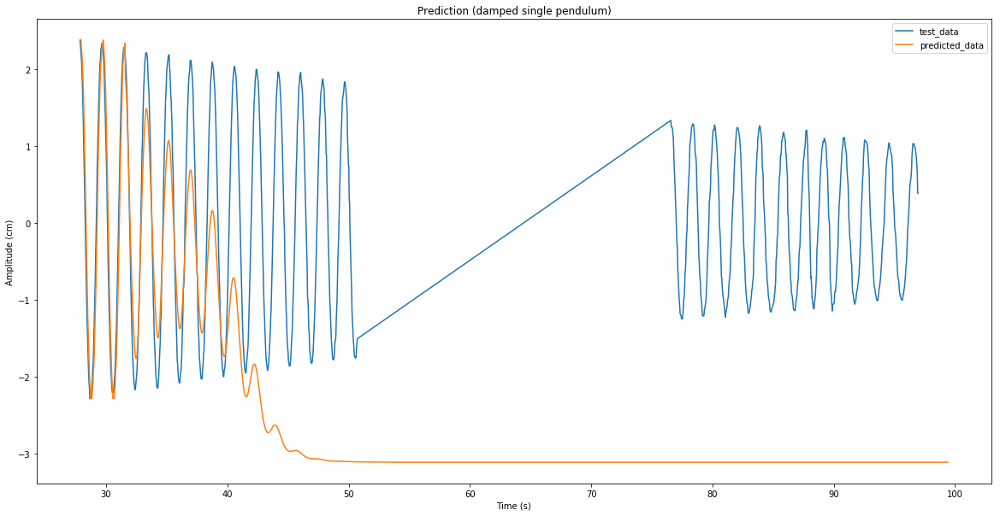

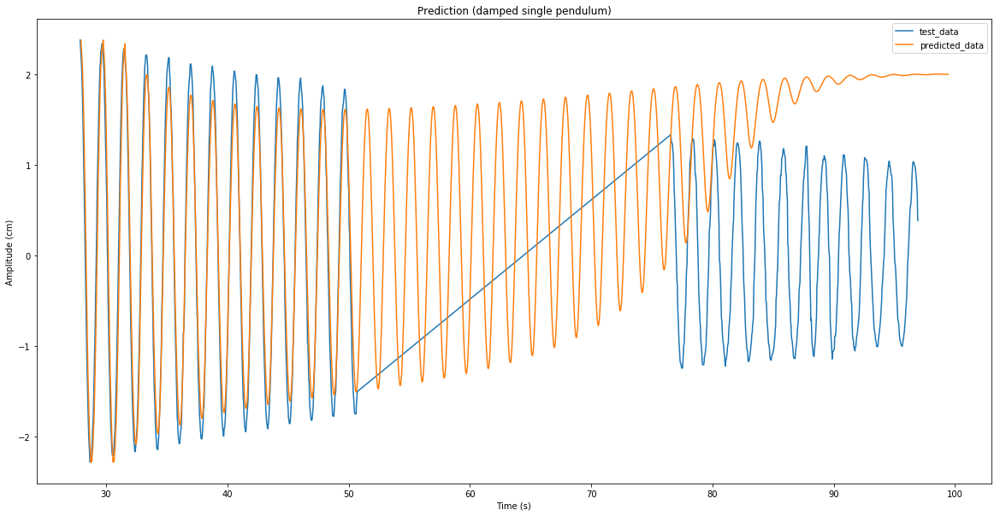

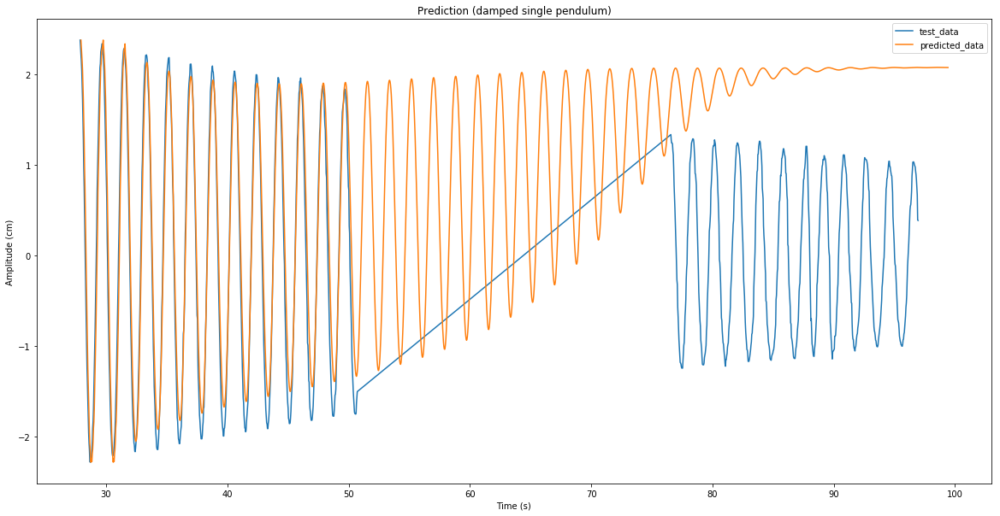

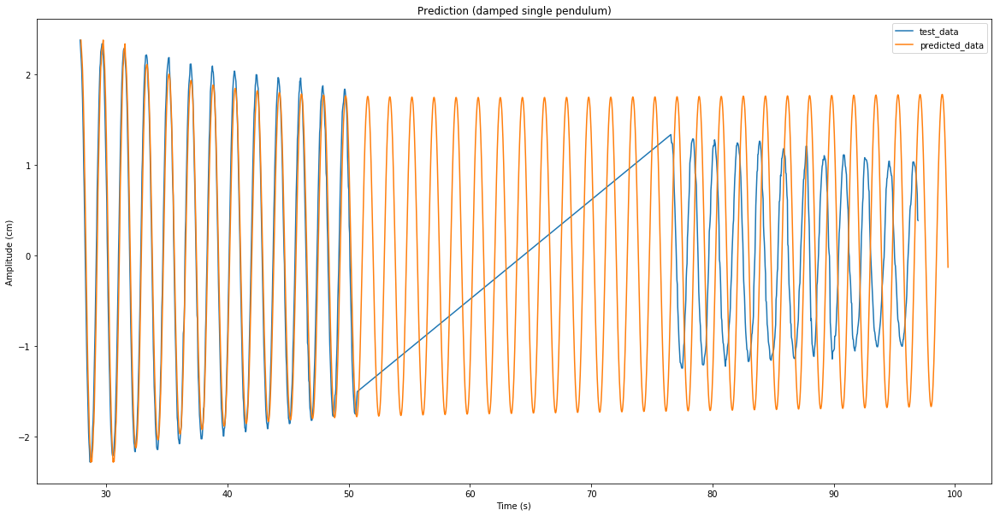

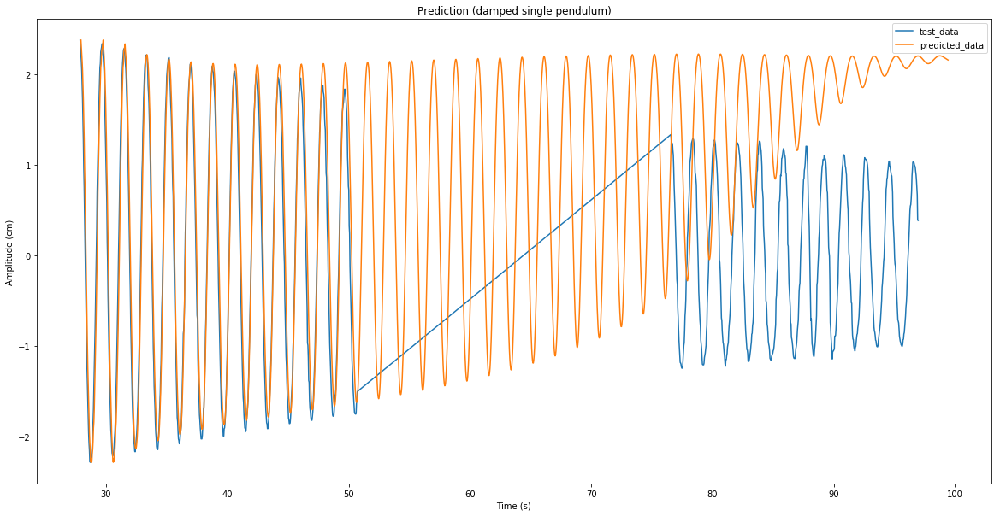

...

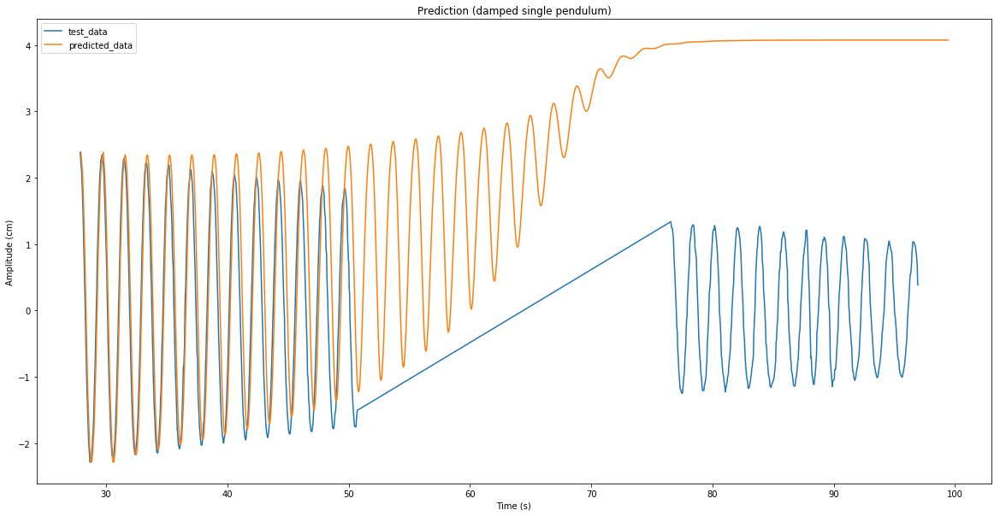

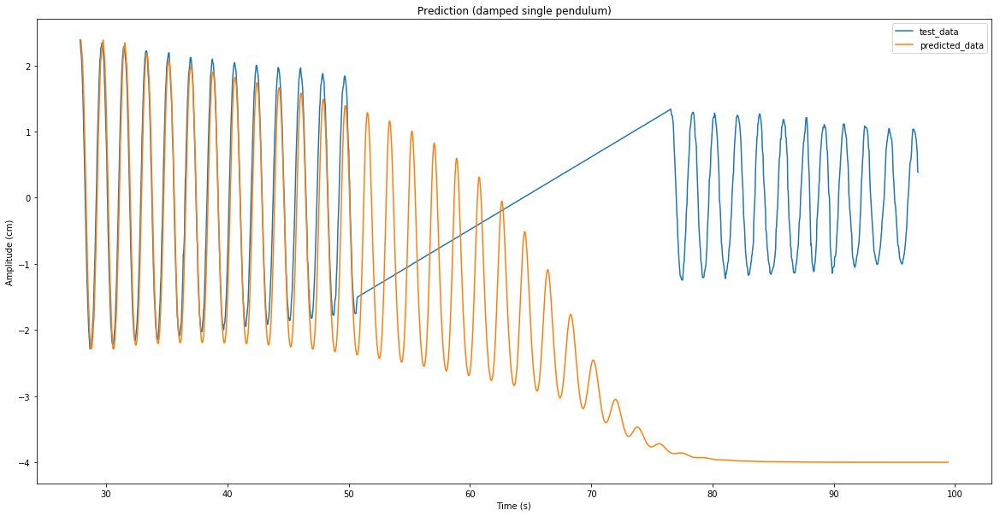

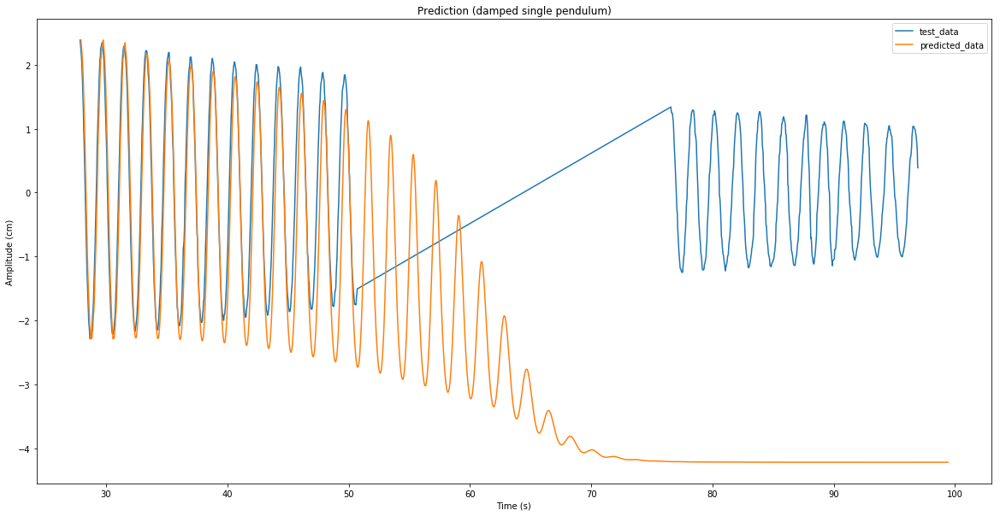

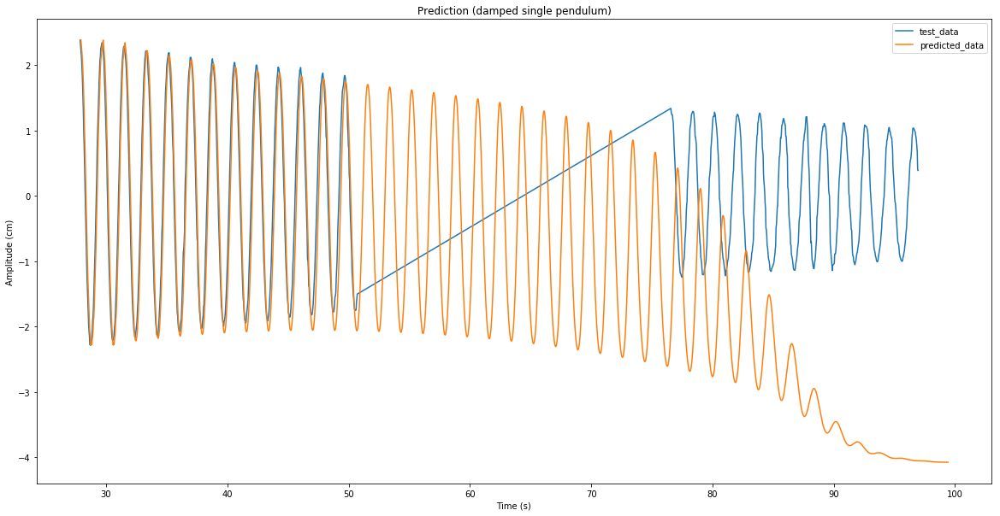

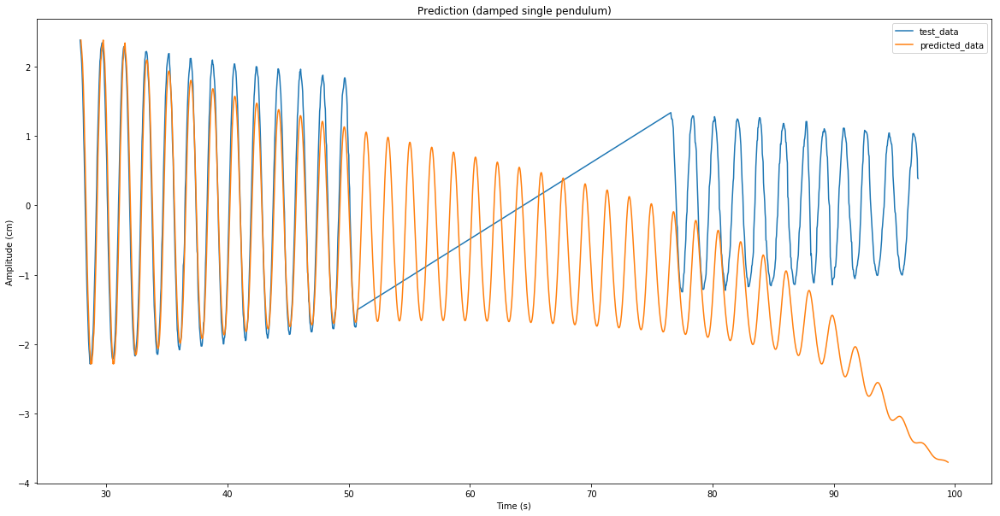

In [10]:
# define model structure
model = Sequential()
model.add(Bidirectional(CuDNNLSTM(units=200, return_sequences=True), input_shape=(None, DATA_DIM)))
model.add(Bidirectional(CuDNNLSTM(units=100, return_sequences=False)))
# model.add(Bidirectional(CuDNNLSTM(units=50, return_sequences=False)))
# model.add(Bidirectional(CuDNNLSTM(units=10, return_sequences=False)))
model.add(Dense(units=1, activation="linear"))
model.compile(loss="mean_squared_error", optimizer="adam")

# and now train the model
# batch_size should be appropriate to your memory size
# number of epochs should be higher for real world problems
for i in range(40):
    history = model.fit(X_train, y_train, batch_size=32, epochs=1, validation_split=0.05)
    # perform modelling
    X_model = data[0:N_PREV]
    modelled_data = list(data[0:N_PREV])
    dims = 1, X_model.shape[0], DATA_DIM
    for i in range(len(data)*3):
        prev_steps = X_model.reshape(*dims)
        next_step = model.predict(prev_steps)
        modelled_data.append(next_step[0])
        X_model = np.append(X_model[1:], next_step)

    # evaluate
    modelled_data = np.append(data[0:N_PREV], np.array(modelled_data), axis=0)
    print('Prediction score:', np.mean((modelled_data[:len(data)]-data)**2))
    
    # visualize prediction performance
    t_start = time[a]
    t2 = np.arange(t_start, t_start+len(modelled_data)*t_step, t_step)

    plt.figure(figsize=(20,10))
    plt.plot(time_data[a:d], X_data[a:d], label='test_data')
    plt.plot(t2[:len(modelled_data)], modelled_data[:], label='predicted_data')
    plt.title('Prediction (damped single pendulum)')
    plt.xlabel('Time (s)')
    plt.ylabel('Amplitude (cm)')
    plt.legend()